# StyleGAN2-ADA: hi-res generative modeling

## [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/ml4a/ml4a-guides/blob/ml4a.net/examples/models/stylegan2_ada.ipynb)

StyleGAN2-ADA is a generative model architecture which generates state-of-the-art, high-resolution images. It is the most recent in [the StyleGAN series](https://nvlabs.github.io/stylegan2/versions.html), and supports improved quality on limited data (ADA). This module is based on the [original code](https://github.com/NVlabs/stylegan2-ada-pytorch) and [paper](https://arxiv.org/abs/1912.04958) by NVIDIA, and comes with several pre-trained models, as well as functions for sampling from the GAN, generating interpolations, and performing operations on the latent space to achieve style-transfer like effects.

## Set up ml4a and enable GPU

If you don't already have ml4a installed, or you are opening this in Colab, first enable GPU (`Runtime` > `Change runtime type`), then run the following cell to install ml4a and its dependencies.

In [ ]:
%tensorflow_version 1.x
!pip3 install --quiet ml4a

## Load stylegan 

You can see what pre-trained models are available with `stylegan.get_pretrained_models`.

In [1]:
from ml4a import image
from ml4a.models import stylegan

stylegan.get_pretrained_models()

dict_keys(['afhqcat', 'afhqdog', 'afhqwild', 'brecahad', 'cifar10', 'ffhq', 'metfaces'])

The variable `network_pkl` refers to the location of the trained pkl file. You can load your own pkl locally from your computer, or get one of the pretrained models listed above.

In [2]:
network_pkl = stylegan.get_pretrained_model('ffhq')
stylegan.load_model(network_pkl)

## Generate random samples

`stylegan.random_sample(n)` will generate `n` random images from the latent space of your trained model. If your model is conditional, you must also supply a label vector.

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


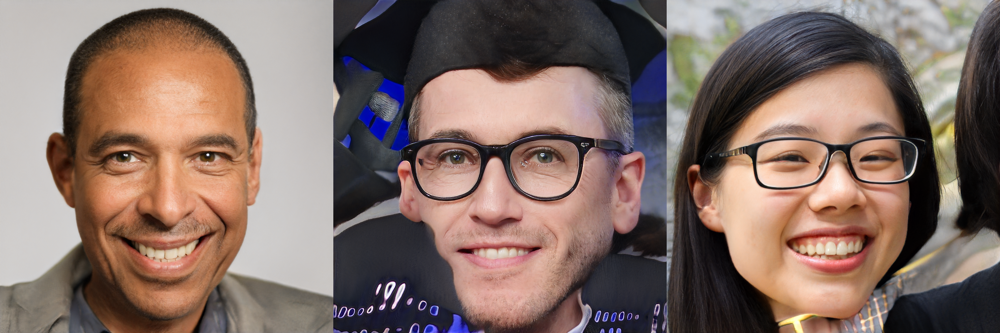

In [3]:
samples = stylegan.random_sample(3, label=None, truncation=1.0)
image.display(samples)

To do this manually with your own latent inputs, use the `stylegan.generate` function on an `N x 512` matrix, where `N` is the number of samples to generate.

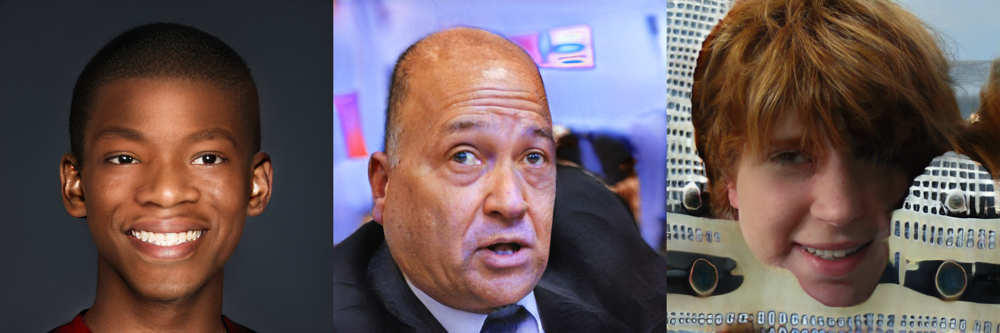

In [4]:
from ml4a import image
import numpy as np

# stylegan.G.z_dim gives you the dimensionality of the latent space
latents = np.random.randn(3, stylegan.G.z_dim)
labels = None
    
img = stylegan.generate(latents, None, truncation=1.0)

image.display(img)

You can quickly generate a "latent walk" video, a random interpolation through the latent space of your model of `duration_sec` seconds long, with `stylegan.generate_interpolation_video`.

In [4]:
latent_video = stylegan.generate_interpolation_video(
    'latent_interpolation.mp4', 
    labels=None,
    truncation=1.0, 
    duration_sec=10.0,
    smoothing_sec=1.0,
    minibatch_size=16
)

100%|██████████| 19/19 [00:20<00:00,  1.08s/it]


Display the generated video inline in the notebook.

In [5]:
image.display_local(latent_video)

# Project an image into the latent space

You can encode a target image into a latent vector which produces a similar image as the target using `stylegan.encode`.

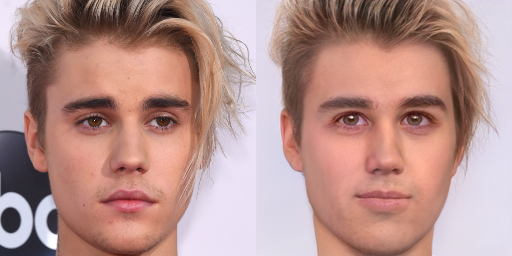

In [16]:
from ml4a import image
from ml4a.utils import face
from PIL import Image

# load image
img = image.load_image('https://www.biography.com/.image/t_share/MTM2OTI2NTY2Mjg5NTE2MTI5/justin_bieber_2015_photo_courtesy_dfree_shutterstock_348418241_croppedjpg.jpg')

# if using the ffhq (faces) model, it helps to run it through the face alignment utility to center-crop it
img, _ = face.align_face(img)

# encode the image into a latent code
projected_w = stylegan.encode(img, num_steps=500, verbose=False)

# generate the reconstructed image from the latent code
img_reconstructed = stylegan.generate(projected_w)

# display
image.display([Image.fromarray(img), img_reconstructed[0]])

Interpolate between two faces.

In [8]:
from ml4a import image
from ml4a.utils import face
import numpy as np

num_frames = 100
url1 = 'https://thumbor.forbes.com/thumbor/fit-in/416x416/filters%3Aformat%28jpg%29/https%3A%2F%2Fspecials-images.forbesimg.com%2Fimageserve%2F5ed00f17d4a99d0006d2e738%2F0x0.jpg%3Fbackground%3D000000%26cropX1%3D154%26cropX2%3D4820%26cropY1%3D651%26cropY2%3D5314'
url2 = 'https://static.billboard.com/files/media/Madonna-press-by-Ricardo-Gomes-2019-billboard-1548-compressed.jpg'

# load images, find and align faces
img1 = image.load_image(url1)
img1, _ = face.align_face(img1)
img2 = image.load_image(url2)
img2, _ = face.align_face(img2)

# project images to stylegan's latent space
projected_w1 = stylegan.encode(img1, num_steps=500, verbose=False)
projected_w2 = stylegan.encode(img2, num_steps=500, verbose=False)

# interpolate between the endpoints
latents = np.linspace(projected_w1.cpu().numpy(), 
                      projected_w2.cpu().numpy(), 
                      num_frames).squeeze()

# generate video and display result
stylegan.generate_video('output.mp4', latents, labels=None, truncation=1.0)
image.display_local('output.mp4')

100%|██████████| 4/4 [00:04<00:00,  1.23s/it]


# Training

The next section deals with training your own models. It will show how to prepare a dataset, begin training StyleGAN, and explain how to resume from existing checkpoints and transfer learn.

## If you are training in Colab...

This notebook is set up to enable you to completely train your model for free using Google Colab. This approach does present some challenges. We review them here and offer a few tips to overcome each problem. If you are not training on Colab, you may skip this section.

**Problem: Colab offers maximum 1 GPU, which makes training StyleGAN very slow.**

There is no way to make Colab train faster, but you may reduce your total training time by using resuming from a pre-trained model or prior checkpoint and transfer learning (more on that later), as well as reducing the total compute needed by using a smaller architecture or resolution (e.g. 256x256 takes 16x less time to train as 1024x1024).

**Problem: Your file system in Colab is ephemeral, created on the spot, and deleted by Google after 12 hours of inactivity. It does not initially have any access to your dataset, and you are at risk of losing your training job.**

Because of the temporariness of the file system, it is best to load your dataset from and save your checkpoints to a location of persistent storage that Colab has access to. The easiest way to do this is by mounting your [Google Drive](https://drive.google.com/) to Colab and doing all of your i/o from there. This will be explained in the next cell.

**Problem: Colab is intended for interaction and tends to disconnect if you go idle for too long, interrupting long-running training jobs.**

As noted in the file system probem, the best solution for this is to save your checkpoints to Google Drive instead of to the Colab file system, and save them more frequently. Then you can babysit the job, restarting and resuming from the latest checkpoint each time you've noticed it gets disconnected.

## Mounting Google Drive

If you will use Google Drive to host your dataset and save your checkpoints, then upload your raw dataset to it, and mount it s a drive in Colab by running the following cell, authenticating it from the pop-up, and entering your authentication token. After you do this, your Google Drive will be available at the path `/drive/My Drive`.

In [ ]:
from google.colab import drive
drive.mount('/drive')

## Dataset preparation

Datasets come in two types: labeled and unlabeled. A labeled dataset may be used to train a conditional model which can generate samples according to a target label, in addition to its latent input.

To make an unlabeled dataset, put a collection of images (JPG and PNG both allowed) into a single directory. 

To make a labaled dataset, create subdirectories into the dataset's root folder. Then make sure to set the `label` argument in the config to `True`, otherwise the subdirectories will be ignored. Later, when you are done training, the class labels will correspond to the subdirectories in alphabetical order.

* `images_folder`: the folder that currently contains the dataset's raw images.
* `dataset_output`: this folder will be created, and the processed dataset will be saved to it.
* `transform`: either "center-crop", "center-crop-wide", or None.
* `labels`: set to True if you'd like to generate a labeled dataset according to the subdirectories in the `images_folder`.
* `size`: 256, 512, or 1024 square images. Note a 2x increase in resolution means 4x the memory requirements and running time.

In [5]:
from ml4a.models import stylegan

# replace 'images_folder' and 'dataset_output' with your own locations.

config = {
    'images_folder': '/drive/My Drive/datasets/wikiart/',
    'dataset_output': '/drive/My Drive/datasets/wikiart_stylegan/',
    'transform': 'center-crop',
    'labels': False,
    'size': 512
}

stylegan.dataset_tool(config)

python /home/bzion/ml4a/ml4a/ml4a/models/submodules/stylegan2-ada-pytorch/dataset_tool.py --source /drive/My\ Drive/datasets/wikiart/ --dest /drive/My\ Drive/datasets/wikiart_stylegan/ --transform center-crop --width 512 --height 512


## Training

Once you've prepared your dataset, you can begin training. 

First, you create a JSON structure with your configuration. An explanation of the arguments:

* `results_dir`: output folder where to put checkpoints, will create the folder if it doesn't already exist (default 'results')
* `save_every`: how many ticks after which to save a checkpoint and preview images of the model. Default is 50, but if you are using Colab or some other environment where you might be interrupted often, can be useful to set it lower so as to avoid losing hours of training if you are disconnected.
* `dataset_root`: a relative or absolute path to the root of the dataset generated with the dataset tool.
* `mirror`: use horizontal flipping to augment the dataset during runtime, can be useful even alongside ADA augmentation (default `False`)
* `labels`: whether to train conditionally to labels or not. If set to `True`, the dataset must have a `dataset.json` file in its root with label assignments for all images, prepared by the dataset tool.
* `base_config`: select an architecture config from these options: 'auto', 'stylegan2', 'paper256', 'paper512', 'paper1024', 'cifar'.  'stylegan2' is the top quality preset but the slowest to train. If 'auto' is selected, StyleGAN2 will choose an architecture depending on dataset characteristics and number of GPUs available (default 'auto'),
* `kimg`: number of images to train on, effectively how long to train for, measured in 1000s of images (default 25000)
* `resume`: resume training from a previous checkpoint. If omitted or set to `None`, training begins on a from scratch. If set to `auto`, the trainer will automatically select the most recent checkpoint for the same dataset and specs if one is found. Otherwise, you can use one of NVIDIA's presets (including 'ffhq256', 'ffhq512', 'ffhq1024', 'celebahq256', 'lsundog256') or give it a relative/absolute path to a pkl file  (default `None`).
* `gpu`: a list of GPU indexes to use, e.g. [0, 1] to use your first two GPUs. If omitted or set to `None`, will automatically revert to using all available card.



In [4]:
from ml4a.models import stylegan

config = {    
    # output options
    'results_dir': '/drive/My Drive/stylegan_models/', # change to your own folder
    'save_every': 30,   
    
    # dataset options
    'dataset_root': '/drive/My Drive/datasets/wikiart_stylegan/', # change to your own datasets
    'mirror': False,
    'labels': False,
    
    # training options
    'base_config': 'stylegan2',
    'kimg': 25000,
    
    # resume from previous checkpoint 
    'resume': 'auto',

    # available GPUs
    'gpu': [0, 1, 2, 3]
}

# begin training
stylegan.train(config)


python /home/bzion/ml4a/ml4a/ml4a/models/submodules/stylegan2-ada-pytorch/train.py --outdir /home/bzion/g/stylegan2-ada-pytorch/ --data /home/bzion/g/my\ drive/datasets/wikiart_ada --cond 0 --snap 30 --mirror 0 --cfg stylegan2 --kimg 25000 --resume /home/bzion/g/stylegan2-ada-pytorch/00000-wikiart_ada-stylegan2-kimg25000-resumeffhq512/network-snapshot-000840.pkl --gpus 4


You will see the checkpoint in the results folder. The `pkl` file can be loaded by the stylegan later to generate samples with.